![MAIA banner](https://raw.githubusercontent.com/MAIA4361-Aprendizaje-refuerzo-profundo/Notebooks_Tareas/main/Images/Aprendizaje_refuerzo_profundo_Banner_V1.png)


<center><h1>RETO 1</h1></center>

# -  Atari (ALE/BattleZone-v5)
**Problema: Dificultad alta — BattleZone (Atari 2600 / ALE)**  
**Nombres:** Renato Patiño - Maria Fernanda Gonzalez

## Tabla de contenido
1. Introducción  
2. Objetivo del reto  
3. Algoritmos seleccionados y justificación  
4. Librerías y versiones empleadas
5. Visualización con TensorBoard  
6. Implementación de Algoritmos (DQN y DDQN)
7. Comparación para la selección del algoritmo  
8. Análisis de los resultados obtenidos del agente seleccionado
9. Descripción del comportamiento aprendido por el agente
10. Conclusiones

# 1. Introducción

BattleZone es un videojuego clásico de Atari 2600 implementado en el Arcade Learning Environment (ALE). En este entorno, el agente controla un tanque armado desde una perspectiva en primera persona dentro de un escenario minimalista que simula profundidad (ilusión tridimensional). El objetivo principal consiste en destruir vehículos enemigos mientras se evita ser impactado por el fuego adversario.

### Especificaciones técnicas del entorno

El entorno utilizado en este trabajo es:

    gymnasium.make("ALE/BattleZone-v5")

Sus características principales son:

- **Espacio de acción:** Discrete(18)
- **Espacio de observación:** Box(0, 255, (210, 160, 3), uint8)
- **Tipo de observación por defecto:** RGB
- **Frameskip:** 4
- **Probabilidad de repetición de acción (sticky actions):** 0.25
- **Modo por defecto:** 1
- **Dificultad por defecto:** 0

El agente inicia con **5 vidas** y puede obtener vidas adicionales al alcanzar ciertos puntajes. La recompensa se obtiene al destruir distintos tipos de enemigos, los cuales otorgan diferentes cantidades de puntos.

---

### BattleZonedesde la perspectiva de RL

#### 1. Observación de alta dimensión

El agente recibe una imagen RGB de tamaño (210 × 160 × 3), lo que implica trabajar con aproximadamente 100,800 valores por estado. Esto hace inviable el uso de representaciones tabulares y requiere el uso de **redes neuronales convolucionales (CNN)** para extraer características espaciales relevantes.

---

#### 2. Espacio de acciones amplio

El entorno posee un espacio de acciones discreto de tamaño 18, que incluye combinaciones de:
- Movimiento (arriba, abajo, izquierda, derecha)
- Movimiento diagonal
- Disparo
- Movimiento + disparo simultáneo


# 2. Objetivo del problema

Desarrollar e implementar un agente de Aprendizaje por Refuerzo Profundo para el entorno ALE/BattleZone-v5, utilizando dos métodos: DQN (Deep Q-Network) y DDQN (Double DQN).

Dado que este problema implica mayor complejidad se decidió realizar una comparación directa entre ambos algoritmos con el objetivo de analizar su desempeño relativo y evaluar si la variante DDQN logra mejorar la estabilidad y el aprendizaje frente al DQN tradicional.

El objetivo de aprendizaje del agente consiste en maximizar la recompensa promedio, evaluada mediante la ejecución de al menos 10 episodios independientes una vez finalizado el entrenamiento.

Para cumplir con los requisitos de entrega, este notebook incluye:

- Implementación completa y ejecutable en Google Colab (incluye instalación de dependencias).
- Entrenamiento con aceleración por GPU.
- Registro de métricas de entrenamiento mediante TensorBoard.
- Uso de checkpoints para permitir la reanudación del entrenamiento en sesiones independientes.
- Evaluación cuantitativa del desempeño (recompensa promedio en al menos 10 episodios).
- Comparación contra una política completamente aleatoria como línea base.
- Comparación entre DQN y DDQN bajo condiciones de entrenamiento equivalentes.
- Evidencia visual mediante videos tanto del proceso de entrenamiento como del comportamiento final del agente.

# 3. Algoritmo seleccionado y justificación

Para resolver el entorno ALE/BattleZone-v5 se realizó un análisis de los métodos de aprendizaje por refuerzo profundo, considerando las características del entorno: observaciones visuales de alta dimensión, espacio de acciones discreto de tamaño 18 y dinámica compleja con alta sensibilidad a errores de decisión.

A partir de este análisis, se seleccionaron dos algoritmos: DQN y DDQN, ambos trabajados durante el curso y ampliamente utilizados en entornos Atari del Arcade Learning Environment (ALE).

La elección se fundamenta en los siguientes criterios:

- El entorno presenta un espacio de acciones discreto, lo que lo hace naturalmente compatible con métodos basados en estimación de valores Q.
- La observación está basada en imágenes RGB, lo cual requiere arquitecturas convolucionales como las utilizadas en DQN.
- La complejidad estratégica del entorno sugiere que podrían presentarse problemas de sobreestimación en los valores Q, lo cual justifica evaluar también la variante DDQN.

Con el fin de tomar una decisión fundamentada sobre el algoritmo más adecuado para este entorno, se decidió implementar y entrenar ambos métodos bajo condiciones comparables, permitiendo realizar un análisis experimental de:

- Estabilidad del entrenamiento.
- Velocidad de convergencia.
- Recompensa promedio en evaluación.
- Variabilidad del desempeño.

De esta manera, la selección final del enfoque más adecuado para BattleZone no se basó únicamente en argumentos teóricos, sino también en evidencia empírica obtenida durante el desarrollo del reto.


# 4. Librerías y versiones empleadas

Para este reto, siguiendo la metodología presentada en los artículos de DQN y Double DQN, se trabajará con el entorno BattleZone de Atari 2600, disponible dentro de los ambientes de Atari de la librería Gymnasium.

Se utilizarán las implementaciones de DQN incluidas en Stable-Baselines3, adaptadas al entorno visual mediante redes convolucionales (CnnPolicy).

Antes de comenzar, se sugiere elegir un entorno de simulación acelerado por GPU. En el caso de Colab gratuito, debería elegir el entorno de T4.

Después de configurar la GPU, se ejecuta el siguiente bloque para instalar todas las librerías necesarias.


## Instalación de librerías


In [ ]:
!pip install stable_baselines3
!pip install sb3-contrib
!pip install ale-py
!pip install "gymnasium[atari,accept-rom-license]" stable-baselines3 autorom renderlab -q
!AutoROM --accept-license
!pip install renderlab

# Stable Baselines 3
import stable_baselines3
from stable_baselines3 import DQN
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.vec_env import VecMonitor
from stable_baselines3.common.evaluation import evaluate_policy
from stable_baselines3.common.callbacks import BaseCallback, CheckpointCallback
from stable_baselines3.common.callbacks import CallbackList
from stable_baselines3.common.vec_env import VecFrameStack, VecMonitor
from stable_baselines3.common.env_util import make_atari_env
from stable_baselines3.common.logger import configure

# Gymnasium y Atari
import gymnasium
import ale_py
import renderlab

gymnasium.register_envs(ale_py)

import os
import torch as th
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import random
import math
import sys
from collections import deque
import cv2

# Limpia salida de instalación
from IPython.display import clear_output
clear_output()

print("Todas las librerías han sido instaladas correctamente.")

Todas las librerías han sido instaladas correctamente.


In [ ]:
import subprocess

subprocess.run(["AutoROM"], input="Y\n", text=True)


  return datetime.utcnow().replace(tzinfo=utc)



CompletedProcess(args=['AutoROM'], returncode=0)

## Versiones y características del hardware

In [ ]:
print("=== Versiones de Librerías ===")
print(f"Python: {sys.version}")
print(f"Stable-Baselines3: {stable_baselines3.__version__}")
print(f"Gymnasium: {gymnasium.__version__}")
print(f"ALE-Py: {ale_py.__version__}")
print(f"Numpy: {np.__version__}")
print(f"Pandas: {pd.__version__}")


print("\n=== Hardware ===")
print("CUDA disponible:", th.cuda.is_available())
if th.cuda.is_available():
    print("GPU:", th.cuda.get_device_name(0))
!nvidia-smi

=== Versiones de Librerías ===
Python: 3.12.12 (main, Oct 10 2025, 08:52:57) [GCC 11.4.0]
Stable-Baselines3: 2.7.1
Gymnasium: 1.2.3
ALE-Py: 0.11.2
Numpy: 2.0.2
Pandas: 2.2.2

=== Hardware ===
CUDA disponible: True
GPU: Tesla T4
Sun Feb 22 02:09:14 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/

# 5. Visualización con TensorBoard

TensorBoard se ejecuta inicialmente antes de comenzar el entrenamiento, definiendo el mismo directorio donde el modelo irá almacenando las métricas mediante el parámetro tensorboard_log. En un primer momento, al no haberse ejecutado aún el entrenamiento, el directorio puede no contener información. Una vez se entrena el agente, es necesario actualizar la visualización.

Adicionalmente, en la configuración de TensorBoard se recomienda activar la opción “Reload data every 30 seconds”, lo que permite actualizar automáticamente las métricas en tiempo real durante el entrenamiento. Esto facilita el monitoreo continuo de la evolución de la recompensa, la pérdida y otros indicadores relevantes del proceso de aprendizaje.



In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/logs

<IPython.core.display.Javascript object>

  return datetime.utcnow().replace(tzinfo=utc)



# 6. Implementación de Algoritmos

## 6.1 DQN

In [ ]:
# Callback personalizado para registrar las recompensas por episodio durante el entrenamiento
class RewardLoggerCallback(BaseCallback):
    def __init__(self):
        super().__init__()
        self.episode_rewards = []  # Lista para almacenar las recompensas de cada episodio

    def _on_step(self) -> bool:
        # Verifica si hay información de episodios en los 'infos' proporcionados por el entorno
        if len(self.locals.get("infos", [])) > 0:
            for info in self.locals["infos"]:
                if "episode" in info:
                    # Agrega la recompensa del episodio a la lista
                    self.episode_rewards.append(info["episode"]["r"])
        return True  # Continúa el entrenamiento

# Clase encargada de entrenar al agente
class BattleZoneTrainer:
    def __init__(self, model_fn, mode=1, difficulty=0, total_timesteps=120_000, log_dir="./logs/battlezone"):
        self.mode = mode
        self.difficulty = difficulty
        self.total_timesteps = total_timesteps
        self.log_dir = log_dir
        os.makedirs(log_dir, exist_ok=True)

        # Crea el entorno Atari con envolturas necesarias
        env = make_atari_env(
            "ALE/BattleZone-v5",
            n_envs=1,
            seed=0,
            env_kwargs={"mode": self.mode, "difficulty": self.difficulty}
        )
        env = VecFrameStack(env, n_stack=4)  # Apila 4 frames para entradas más ricas
        env = VecMonitor(env)

        self.env = env
        self.model = model_fn(self.env)  # Crea el modelo usando la función proporcionada

        # Instancia del callback para registrar recompensas
        self.reward_callback = RewardLoggerCallback()

        # Checkpoints (carpeta)
        checkpoints_path = os.path.join(log_dir, "checkpoints")
        os.makedirs(checkpoints_path, exist_ok=True)

        # Checkpoints
        self.checkpoint_callback = CheckpointCallback(
            save_freq=40_000,
            save_path=checkpoints_path,
            name_prefix="battlezone"
        )

        # Une callbacks (recompensas + checkpoints)
        self.callback = CallbackList([self.reward_callback, self.checkpoint_callback])

    def train(self, save_path="dqn_battlezone_model"):
        # Entrena el modelo y guarda el archivo resultante
        self.model.learn(
            total_timesteps=self.total_timesteps,
            log_interval=20,
            callback=self.callback
        )
        self.model.save(save_path)
        print("Training complete. Model saved:", save_path)

    def plot_rewards(self, title="Training Rewards Over Time"):
        # Grafica la evolución de las recompensas por episodio
        if not self.reward_callback.episode_rewards:
            print("No reward data to plot.")
            return

        plt.figure(figsize=(10, 5))
        plt.plot(self.reward_callback.episode_rewards, label="Episode Reward")
        plt.xlabel("Episodes")
        plt.ylabel("Reward")
        plt.title(title)
        plt.grid()
        plt.legend()
        plt.tight_layout()
        plt.show()

    def evaluate(self, n_eval_episodes=10):
        # Evalúa el agente entrenado en 10 episodios
        eval_env = make_atari_env(
            "ALE/BattleZone-v5",
            n_envs=1,
            seed=42,
            env_kwargs={"mode": self.mode, "difficulty": self.difficulty}
        )
        eval_env = VecFrameStack(eval_env, n_stack=4)

        mean_reward, std_reward = evaluate_policy(
            self.model,
            eval_env,
            n_eval_episodes=n_eval_episodes,
            deterministic=True
        )
        print(f"Evaluación ({n_eval_episodes} episodios) -> mean_reward={mean_reward:.2f}, std={std_reward:.2f}")
        return mean_reward, std_reward

    def evaluate_random(self, n_eval_episodes=10):
        # Evalúa una política completamente aleatoria (opcional)
        env = gymnasium.make(
            "ALE/BattleZone-v5",
            mode=self.mode,
            difficulty=self.difficulty
        )

        total_rewards = []

        for _ in range(n_eval_episodes):
            obs, info = env.reset()
            terminated = False
            truncated = False
            episode_reward = 0

            while not (terminated or truncated):
                action = env.action_space.sample()
                obs, reward, terminated, truncated, info = env.step(action)
                episode_reward += reward

            total_rewards.append(episode_reward)

        mean_reward = float(np.mean(total_rewards))
        std_reward = float(np.std(total_rewards))

        print(f"Random policy ({n_eval_episodes} episodios) -> mean_reward={mean_reward:.2f}, std={std_reward:.2f}")
        return mean_reward, std_reward

    def generate_video(self, model_path="dqn_battlezone_model", output_dir="./output"):
        # Carga el modelo entrenado y genera un video del agente actuando
        os.makedirs(output_dir, exist_ok=True)
        model = self.model.__class__.load(model_path)

        # Crea el entorno con modo de renderizado RGB para capturar imágenes
        env = gymnasium.make(
            "ALE/BattleZone-v5",
            render_mode="rgb_array",
            mode=self.mode,
            difficulty=self.difficulty
        )
        env = renderlab.RenderFrame(env, output_dir)  # Envuelve el entorno para capturar video

        frame_stack = deque(maxlen=4)  # Pila de frames para mantener formato como en entrenamiento

        # Función para preprocesar las observaciones: convierte a escala de grises y redimensiona
        def preprocess(obs):
            gray = obs.mean(axis=2).astype(np.uint8)
            resized = cv2.resize(gray, (84, 84), interpolation=cv2.INTER_AREA)
            return resized

        obs, info = env.reset()
        preprocessed = preprocess(obs)
        for _ in range(4):
            frame_stack.append(preprocessed)

        terminated = False
        truncated = False
        total_reward = 0

        while not (terminated or truncated):
            stacked_obs = np.stack(frame_stack, axis=0)
            action, _ = model.predict(stacked_obs, deterministic=True)

            obs, reward, terminated, truncated, info = env.step(int(action))
            total_reward += reward

            preprocessed = preprocess(obs)
            frame_stack.append(preprocessed)

        print("Recompensa obtenida en el episodio (video):", total_reward)
        env.play()  # Reproduce el video generado

Para el entorno ALE/BattleZone-v5 se implementó un agente basado en Deep Q-Network (DQN) utilizando la política "CnnPolicy" de Stable-Baselines3, adecuada para observaciones visuales provenientes de imágenes.


Hiperparámetros principales

- Learning rate: 1e-4
- Buffer size: 40,000
- Batch size: 32
- Gamma: 0.99
- Train frequency: 4
- Target update interval: 10,000
- Exploración: ε decae de 1.0 a 0.08 en el 40% del entrenamiento
- Total timesteps: 120,000

Se utilizó frame stacking de 4 imágenes consecutivas y se implementaron checkpoints para permitir la reanudación del entrenamiento.

El desempeño del agente se evaluó mediante la recompensa promedio en 10 episodios independientes, comparación contra una política aleatoria y análisis de métricas en TensorBoard.

DQN se utilizó como agente base para posteriormente contrastarlo con su variante DDQN en el mismo entorno.

  warnings.warn(



Using cuda device
Wrapping the env in a VecTransposeImage.


  return datetime.utcnow().replace(tzinfo=utc)



Logging to ./logs/battlezone_dqn_fast/DQN_1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 70.8     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.973    |
| time/               |          |
|    episodes         | 20       |
|    fps              | 280      |
|    time_elapsed     | 5        |
|    total_timesteps  | 1415     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 62       |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.953    |
| time/               |          |
|    episodes         | 40       |
|    fps              | 221      |
|    time_elapsed     | 11       |
|    total_timesteps  | 2478     |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.1e-05  |
|    n_updates        | 119      |
----------------------------------
----------------------------------
| rollout/ 

Moviepy - Done !
Moviepy - video ready temp-{start}.mp4


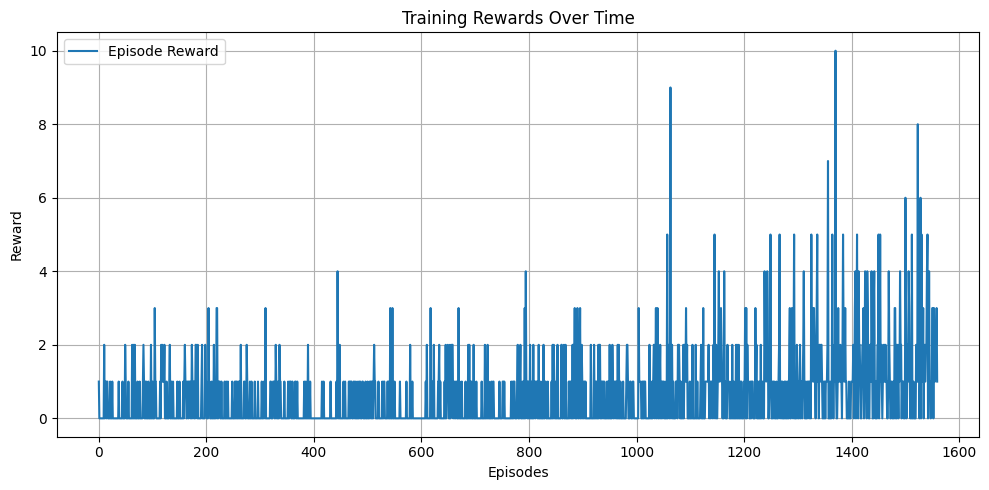

In [ ]:
def create_model(env):
    return DQN(
        "CnnPolicy",
        env,
        learning_rate=1e-4,
        buffer_size=40_000,
        learning_starts=2_000,
        batch_size=32,
        gamma=0.99,
        train_freq=4,
        target_update_interval=10_000,
        exploration_fraction=0.4,
        exploration_initial_eps=1.0,
        exploration_final_eps=0.08,
        verbose=1,
        tensorboard_log="./logs/battlezone_dqn_fast",
        device="cuda"
    )

trainer = BattleZoneTrainer(
    model_fn=create_model,
    mode=1,
    difficulty=0,
    total_timesteps=120_000,
    log_dir="./logs/battlezone_dqn_fast"
)

trainer.train(save_path="dqn_battlezone_fast")
trainer.evaluate(n_eval_episodes=10)
trainer.evaluate_random(n_eval_episodes=10)
trainer.generate_video(model_path="dqn_battlezone_fast", output_dir="./video_dqn_fast")
trainer.plot_rewards()

Se renderizaron dos videos para comprobar tambien el cambio, uno de entrenamiento y otro final entrenado

In [ ]:
trainer.generate_video(
    model_path="./logs/battlezone_dqn_fast/checkpoints/battlezone_40000_steps.zip",
    output_dir="./video_mid"
)

Recompensa obtenida en el episodio (video): 3000.0
Moviepy - Building video temp-{start}.mp4.
Moviepy - Writing video temp-{start}.mp4



Moviepy - Done !
Moviepy - video ready temp-{start}.mp4


### Analisis inicial de DQN

El análisis del agente DQN entrenado en el entorno ALE/BattleZone-v5 evidencia un aprendizaje significativo cuando se compara con una política completamente aleatoria. Durante la evaluación en 10 episodios independientes, el agente entrenado alcanzó una recompensa promedio de 5300 puntos, mientras que la política aleatoria obtuvo un promedio de 2700 puntos. Esta diferencia de aproximadamente 2600 puntos demuestra que el agente logró desarrollar una estrategia considerablemente superior al comportamiento aleatorio, alcanzando más de tres veces la recompensa promedio del baseline.

## 6.2 DDQN

Con el fin de evaluar si es posible mejorar el desempeño obtenido con DQN en el entorno ALE/BattleZone-v5, se implementó directamente una versión ajustada de Double Deep Q-Network (DDQN). Esta variante se selecciona debido a su capacidad para reducir el sesgo de sobreestimación presente en DQN, lo cual puede resultar especialmente relevante en entornos con espacios de acción amplios y alta variabilidad como BattleZone.

In [ ]:
class DoubleDQN(DQN):
    def train(self, gradient_steps: int, batch_size: int = 100) -> None:
        self.policy.set_training_mode(True)
        self._update_learning_rate(self.policy.optimizer)

        for _ in range(gradient_steps):
            replay_data = self.replay_buffer.sample(batch_size, env=self._vec_normalize_env)

            with th.no_grad():
                # Selección con ONLINE net
                next_q_online = self.q_net(replay_data.next_observations)
                next_actions = next_q_online.argmax(dim=1, keepdim=True)

                # Evaluación con TARGET net
                next_q_target = self.q_net_target(replay_data.next_observations)
                next_q_value = next_q_target.gather(1, next_actions)

                target_q = replay_data.rewards + (1 - replay_data.dones) * self.gamma * next_q_value

            current_q = self.q_net(replay_data.observations).gather(1, replay_data.actions.long())
            loss = F.smooth_l1_loss(current_q, target_q)

            self.policy.optimizer.zero_grad()
            loss.backward()
            th.nn.utils.clip_grad_norm_(self.policy.parameters(), self.max_grad_norm)
            self.policy.optimizer.step()

        self._n_updates += gradient_steps

En comparación con la configuración utilizada en DQN, se incrementó el tamaño del replay buffer, el número de pasos antes de iniciar el aprendizaje y la duración total del entrenamiento, permitiendo una mayor diversidad de experiencias y una consolidación más robusta de la política.

Los hiperparámetros principales utilizados fueron:
- Learning rate: 1e-4
- Buffer size: 80,000
- Learning starts: 10,000
- Batch size: 32
- Gamma: 0.99
- Train frequency: 4
- Target update interval: 10,000
- Exploration fraction: 0.6
- Exploration final epsilon: 0.02
- Total timesteps: 200,000

Using cuda device
Wrapping the env in a VecTransposeImage.
Logging to ./logs/battlezone_ddqn_tuned/DQN_1
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 70.8     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.988    |
| time/               |          |
|    episodes         | 20       |
|    fps              | 262      |
|    time_elapsed     | 5        |
|    total_timesteps  | 1415     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 65.5     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.979    |
| time/               |          |
|    episodes         | 40       |
|    fps              | 277      |
|    time_elapsed     | 9        |
|    total_timesteps  | 2622     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 63       |
|    ep_rew_mean    

  warnings.warn(



Random policy (10 episodios) -> mean_reward=2800.00, std=3187.48
Recompensa obtenida en el episodio (video): 6000.0
Moviepy - Building video temp-{start}.mp4.
Moviepy - Writing video temp-{start}.mp4



t:  93%|█████████▎| 1063/1149 [00:01<00:00, 662.25it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.12/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file ./video_ddqn_tuned/1771728423.7198517.mp4, 100800 bytes wanted but 0 bytes read,at frame 1148/1149, at time 38.27/38.27 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+



Moviepy - Done !
Moviepy - video ready temp-{start}.mp4


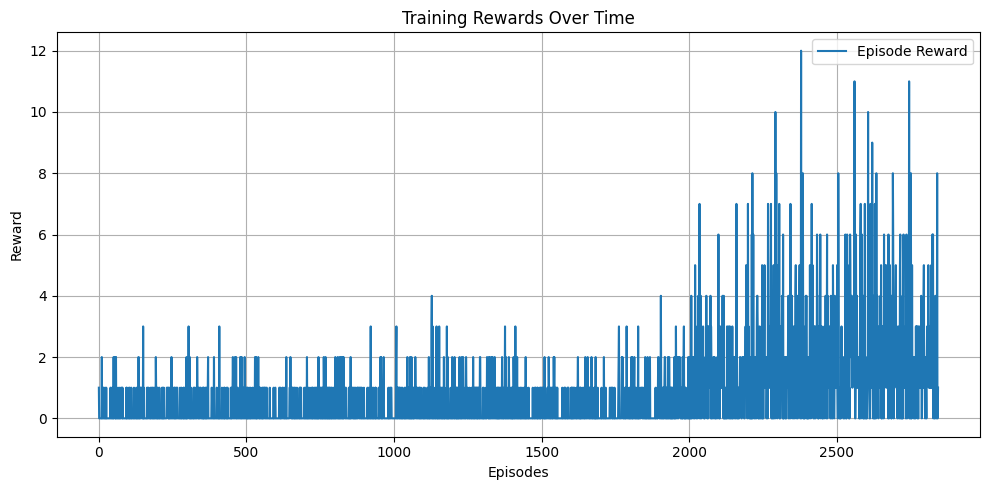

In [ ]:
def create_model_ddqn(env):
    return DoubleDQN(
        "CnnPolicy",
        env,
        learning_rate=1e-4,
        buffer_size=80_000,
        learning_starts=10_000,
        batch_size=32,
        gamma=0.99,
        train_freq=4,
        target_update_interval=10_000,
        exploration_fraction=0.6,
        exploration_initial_eps=1.0,
        exploration_final_eps=0.02,
        verbose=1,
        tensorboard_log="./logs/battlezone_ddqn_tuned",
        device="cuda"
    )

trainer_ddqn = BattleZoneTrainer(
    model_fn=create_model_ddqn,
    mode=1,
    difficulty=0,
    total_timesteps=200_000,
    log_dir="./logs/battlezone_ddqn_tuned"
)

trainer_ddqn.train(save_path="ddqn_battlezone_tuned")
trainer_ddqn.evaluate(n_eval_episodes=10)
trainer_ddqn.evaluate_random(n_eval_episodes=10)
trainer_ddqn.generate_video(model_path="ddqn_battlezone_tuned.zip", output_dir="./video_ddqn_tuned")
trainer_ddqn.plot_rewards()

Se renderizaron dos videos para comprobar tambien el cambio, uno de entrenamiento y otro final entrenado

In [ ]:
trainer_ddqn.generate_video(
    model_path="./logs/battlezone_ddqn_tuned/checkpoints/battlezone_160000_steps.zip",
    output_dir="./video_ddqn_tuned_mid"
)

Recompensa obtenida en el episodio (video): 14000.0
Moviepy - Building video temp-{start}.mp4.
Moviepy - Writing video temp-{start}.mp4



Moviepy - Done !
Moviepy - video ready temp-{start}.mp4


### Analisis de DDQN

El agente DDQN tuned entrenado en el entorno ALE/BattleZone-v5 obtuvo una recompensa promedio de 13,200 puntos en la evaluación realizada sobre 10 episodios independientes, superando ampliamente a la política aleatoria, la cual alcanzó únicamente 2,800 puntos en promedio. Esta diferencia de más de 10,400 puntos evidencia un aprendizaje sustancialmente superior al azar y confirma que el agente logró desarrollar estrategias efectivas para maximizar la recompensa acumulada.

En conjunto, los resultados cuantitativos y cualitativos permiten concluir que la configuración ajustada de DDQN no solo supera ampliamente el comportamiento aleatorio, sino que también muestra capacidad de alcanzar desempeños elevados en episodios individuales

# 7. Comparación para la selección del algoritmo




In [ ]:
dqn_mean, dqn_std = trainer.evaluate(n_eval_episodes=10)

Evaluación (10 episodios) -> mean_reward=5300.00, std=3226.45


In [ ]:
ddqn_mean, ddqn_std = trainer_ddqn.evaluate(n_eval_episodes=10)

Evaluación (10 episodios) -> mean_reward=13200.00, std=3515.68


In [ ]:
results = [
    {"Modelo": "DQN", "MeanReward": dqn_mean, "StdReward": dqn_std},
    {"Modelo": "DDQN", "MeanReward": ddqn_mean, "StdReward": ddqn_std},
]

df = pd.DataFrame(results).sort_values("MeanReward", ascending=False)
df

,Modelo,MeanReward,StdReward
1,DDQN,13200.0,3515.679166
0,DQN,5300.0,3226.453161


  return datetime.utcnow().replace(tzinfo=utc)



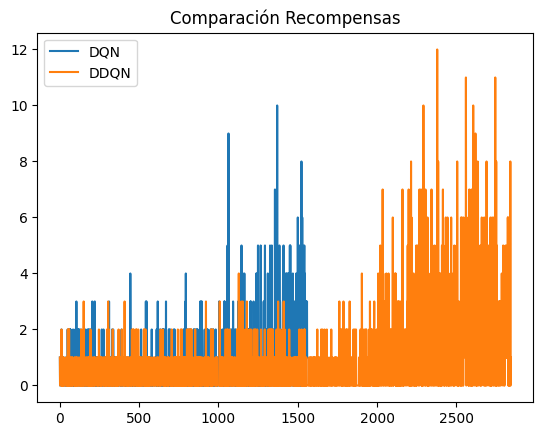

In [ ]:
plt.plot(trainer.reward_callback.episode_rewards, label="DQN")
plt.plot(trainer_ddqn.reward_callback.episode_rewards, label="DDQN")
plt.legend()
plt.title("Comparación Recompensas")
plt.show()

La comparación cuantitativa entre DQN y DDQN en el entorno ALE/BattleZone-v5 muestra una diferencia clara en desempeño promedio. El agente DQN obtuvo una recompensa media de 5,300 puntos, mientras que el agente DDQN tuned alcanzó una recompensa promedio de 13,200 puntos.

Esto representa una mejora aproximada del 40% en la recompensa promedio a favor de DDQN respecto a DQN. La diferencia absoluta de 7,900 puntos evidencia que la variante Double DQN logra extraer un mejor desempeño. Y en la gráfica comparativa de recompensas por episodio se observa que DDQN presenta picos más altos y una mayor frecuencia de episodios con recompensas superiores en etapas avanzadas del entrenamiento.



#8. Análisis de los resultados obtenidos del agente seleccionado DDQN

El agente seleccionado para el entorno BattleZone fue DDQN, tras realizar una comparación experimental frente a DQN. El entrenamiento se llevó a cabo durante un total de 200,000 timesteps, permitiendo una exploración más prolongada y una mayor consolidación del aprendizaje.

### Puntaje promedio obtenido por el agente
En términos cuantitativos, el agente DDQN obtuvo una recompensa promedio de 13,200 puntos evaluada sobre 10 episodios independientes, con una desviación estándar de 3,187 puntos. En contraste, la política completamente aleatoria alcanzó únicamente 2,800 puntos en promedio. Esta diferencia superior a 10,400 puntos confirma que el agente logró aprender una política sustancialmente superior al azar.

###Tiempo de entrenamiento
El tiempo total de entrenamiento fue aproximadamente 20 minutos, dependiendo de la disponibilidad y carga de la GPU en la sesión de ejecución

###Gráfica de la evolución de la recompensa
La gráfica de evolución de recompensas por episodio para el Agente DDQN  muestra que las primeras etapas del entrenamiento se observa una predominancia de recompensas bajas (0–2), lo cual es consistente con una fase inicial de exploración intensa, donde el agente aún no ha consolidado una estrategia efectiva.

A medida que avanza el entrenamiento, comienzan a aparecer episodios con recompensas más elevadas (3, 4 y hasta 7 en la escala normalizada del gráfico), lo que indica que el agente empieza a identificar patrones favorables dentro del entorno.

#9. Descripción del comportamiento aprendido por el agente DDQN

El agente DDQN tuned aprendió a desarrollar un comportamiento progresivamente más estructurado en el entorno BattleZone, mostrando mayor supervivencia, mejor direccionamiento de disparos y acumulación sostenida de puntos en comparación con las fases iniciales del entrenamiento.

Este desempeño se relaciona directamente con el uso de Double DQN, que reduce el sesgo de sobreestimación en la estimación de los valores Q, favoreciendo decisiones más estables en un espacio de acciones amplio (18 acciones). Asimismo, los hiperparámetros seleccionados —como el aumento del replay buffer a 80,000, el inicio tardío del aprendizaje (10,000 pasos), una exploración prolongada (ε decay del 60%) y un mayor número total de timesteps (200,000)— permitieron una consolidación más consistente de la política, contribuyendo a un mejor desempeño promedio frente a DQN estándar.

# 10. Conclusión

En el entorno ALE/BattleZone-v5, los resultados obtenidos demuestran que los métodos value-based con aproximación profunda mediante redes neuronales convolucionales son capaces de aprender políticas efectivas a partir de observaciones visuales de alta dimensión. Tanto DQN como DDQN lograron superar ampliamente el desempeño de una política completamente aleatoria, evidenciando que el agente es capaz de identificar patrones estratégicos dentro del entorno. Sin embargo, la comparación experimental mostró que DDQN, especialmente en su versión ajustada, alcanzó una recompensa promedio superior, lo que sugiere una mejor estimación de los valores Q y una mayor capacidad de explotación en un espacio de acciones amplio.

La reducción del sesgo de sobreestimación introducida por DDQN, junto con una exploración más prolongada y un mayor número de interacciones con el entorno, permitió consolidar una política más robusta frente a la complejidad estratégica de BattleZone.